In [79]:
import itertools
import numpy as np
import os
import seaborn as sns
from tqdm import tqdm
from dataclasses import asdict, dataclass, field
import vsketch
import shapely.geometry as sg
from shapely.geometry import box, MultiLineString, Point, MultiPoint, Polygon, MultiPolygon, LineString
import shapely.affinity as sa
import shapely.ops as so
import matplotlib.pyplot as plt
import pandas as pd

import vpype_cli
from typing import List, Generic
from genpen import genpen as gp
from genpen.utils import Paper
from scipy import stats as ss
import geopandas
from shapely.errors import TopologicalError
import functools
import vpype
from skimage import io
from pathlib import Path

from sklearn.preprocessing import minmax_scale
from skimage import feature
from skimage import exposure

from skimage import filters
from skimage.color import rgb2gray
from skimage.transform import rescale, resize, downscale_local_mean
from skimage.morphology import disk

In [4]:
def local_angle(dx, dy):
    """Calculate the angles between horizontal and vertical operators."""
    return np.mod(np.arctan2(dy, dx), np.pi)

In [80]:
image_path= '/home/naka/art/vqgan_clip/20210816_014617_books_rising_out_of_the_watervray_unreal_engine_style0091.png'
# filename = 'a_beautiful_sunset_made_entirely_of_feminine_eyes.svg'
paper_size:str = '14x11 inches'
border:float=20  # mm
image_rescale_factor:float=0.7
smooth_disk_size:int=2
hist_clip_limit=0.1
hist_nbins=64
intensity_min=0.
intensity_max=1.
hatch_spacing_min=0.3  # mm
hatch_spacing_max=1.2  # mm
pixel_width=1  # mm
pixel_height=1  # mm
angle_jitter='ss.norm(scale=3).rvs'  # degrees
# angle_jitter='0'
pixel_rotation='0'  # degrees
merge_tolerances=[0.1, 0.2, 0.3]  # mm
simplify_tolerances=[0.05, 0.1, ]  # mm
savedir='/home/naka/art/plotter_svgs'

In [81]:
# make page
paper = Paper(paper_size)
drawbox = paper.get_drawbox(border)

# load
img =  rgb2gray(io.imread(Path(image_path)))
img_rescale = rescale(img, image_rescale_factor)

# 
# img_renorm = exposure.equalize_adapthist(img_rescale, clip_limit=hist_clip_limit, nbins=hist_nbins)
img_renorm = img_rescale

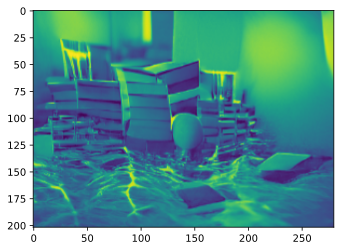

In [82]:
plt.imshow(img_renorm)

In [83]:
# calc dominant angle
selem = disk(smooth_disk_size)
filt_img = filters.rank.mean(img_renorm, selem)
angle_farid = local_angle(filters.farid_h(filt_img), filters.farid_v(filt_img))

# make pixel polys
prms = []
for y, row in tqdm(enumerate(img_renorm)):
    for x, intensity in enumerate(row):

        p = gp.centered_box(Point(x, y), width=pixel_width, height=pixel_height)
        a = np.degrees(angle_farid[y, x])
        prm = {
            'geometry':p,
            'x':x,
            'y':y,
            'raw_pixel_width':pixel_width,
            'raw_pixel_height':pixel_height,
            'intensity': intensity,
            'angle':a,
            'group': 'raw_hatch_pixel',

        }
        prms.append(prm)
raw_hatch_pixels = geopandas.GeoDataFrame(prms)

202it [00:02, 96.14it/s]


In [84]:
#  rescale polys to fit in drawbox
bbox = box(*raw_hatch_pixels.total_bounds)
_, transform = gp.make_like(bbox, drawbox, return_transform=True)
A = gp.AffineMatrix(**transform)
scaled_hatch_pixels = raw_hatch_pixels.copy()
scaled_hatch_pixels['geometry'] = scaled_hatch_pixels.affine_transform(A.A_flat)

In [85]:
example_height = gp.get_height(scaled_hatch_pixels.loc[0, 'geometry'])
example_width = gp.get_width(scaled_hatch_pixels.loc[0, 'geometry'])
print(f'pixel size = {example_width:.2}x{example_height:.2}mm')
scaled_hatch_pixels['scaled_pixel_height'] = example_height
scaled_hatch_pixels['scaled_pixel_width'] = example_width

pixel size = 1.1x1.1mm


In [86]:
scaled_hatch_pixels['scaled_pixel_min_dim'] = scaled_hatch_pixels.loc[:, ['scaled_pixel_height', 'scaled_pixel_width']].min(axis=1)

In [87]:
# distributions etc
angle_jitter_gen = gp.make_callable(eval(angle_jitter))
pixel_rotation_gen = gp.make_callable(eval(pixel_rotation))


scaled_hatch_pixels['angle_jitter'] = angle_jitter_gen(len(scaled_hatch_pixels))
scaled_hatch_pixels['hatch_angle'] = scaled_hatch_pixels['angle'] + scaled_hatch_pixels['angle_jitter']
scaled_hatch_pixels['pixel_rotation'] = pixel_rotation_gen(len(scaled_hatch_pixels))

In [88]:
intensity_min = 0
intensity_max = 1

In [89]:
hatch_spacing_min = 0.2

In [90]:
hatch_spacing_max = 0.9

In [91]:
spacing_func = functools.partial(np.interp, xp=[intensity_min, intensity_max], fp=[hatch_spacing_max, hatch_spacing_min, ])
scaled_hatch_pixels['spacing'] = spacing_func(1 - scaled_hatch_pixels['intensity'])

In [92]:
filt_scaled_hatch_pixels = scaled_hatch_pixels.query('spacing < scaled_pixel_min_dim')

In [93]:
new_rows = []
for i, row in tqdm(filt_scaled_hatch_pixels.iterrows(), total=len(filt_scaled_hatch_pixels)):
    r = row.copy()

    p = r['geometry']
    if abs(r['pixel_rotation']) > np.finfo(float).eps:
        p = sa.rotate(p, r['pixel_rotation'])
    f = gp.hatchbox(p, spacing=r['spacing'], angle=r['hatch_angle'])
    r['geometry'] = f
    new_rows.append(r)

fills = geopandas.GeoDataFrame(new_rows)
fills = fills[fills.length > 0]
fill_layer = gp.merge_LineStrings(fills.geometry)

100%|██████████| 56560/56560 [00:19<00:00, 2943.30it/s]


In [94]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.stroke(1)
sk.geometry(fill_layer)
sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-08-15T19:01:41.637344 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 

In [96]:
merge_tolerances=[0.1, 0.2, 0.3, 0.6, ]  # mm
simplify_tolerances=[0.05, 0.1,]  # mm

In [ ]:
for tolerance in merge_tolerances:
    sk.vpype(f'linemerge --tolerance {tolerance}mm')
            
for tolerance in simplify_tolerances:
    sk.vpype(f'linesimplify --tolerance {tolerance}mm')
sk.display()

In [95]:
sk.vpype('linesort')

In [100]:
import fn

In [101]:
plot_id = fn.new_plot_id()

saved 20210815-190549_209275-1edfd-679373 to s3://algorithmic-ink/current_plot_id


In [102]:
savedir='/home/naka/art/plotter_svgs'

In [103]:
savepath = Path(savedir).joinpath(f'{plot_id}.svg').as_posix()
sk.save(savepath)